# YOLO6 Object Detection - Paper Explanation and Inference

This is the accompanying notebook for the blog post YOLO6 Object Detection - Paper Explanation and Inference. In this notebook, we carry out inference on images using a few of the pretrained YOLOv6 models.

## YOLOv6 Object Detector - An Overview

YOLOv6 is the latest model in the YOLO family which gives state-of-the-art accuracy and speed.

<img src="https://learnopencv.com/wp-content/uploads/2022/10/yolov6-model-architecture.png">

YOLOv6 employs a lot of new approaches to achieve state-of-the-art results. But we can summarize them into three points:
* **Anchor free**: YOLOv6 is anchor free which provides better generalizability and costs less time in post-processing.
* **The model architecture**: YOLOv6 comes with a revised reparameterized backbone and neck.
* **Loss functions**: YOLOv6 used Varifocal loss (VFL) for classification and Distribution Focal loss (DFL) for detection.
* **Industry Handy Improvements**: Longer training epochs, quantization, and knowledge distillation. These are some of the techniques that make YOLOv6 models some of the best for real-time industrial applications.

In the following code cells, we carry out inference using the YOLOv6-Medium model and visualize the outputs.

## Imports

In [1]:
import os
import requests

import cv2
import matplotlib.pyplot as plt

In [2]:
if not os.path.exists('YOLOv6'):
    !git clone https://github.com/meituan/YOLOv6.git

Cloning into 'YOLOv6'...
remote: Enumerating objects: 2255, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 2255 (delta 33), reused 58 (delta 25), pack-reused 2181
Receiving objects: 100% (2255/2255), 25.34 MiB | 9.56 MiB/s, done.
Resolving deltas: 100% (1280/1280), done.


In [3]:
%cd YOLOv6/

/content/YOLOv6


## Install the Requirements

In [4]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 5.0 MB/s 
     |████████████████████████████████| 2.0 MB 60.9 MB/s 
     |████████████████████████████████| 237 kB 78.6 MB/s 
     |████████████████████████████████| 51 kB 6.1 MB/s 


## Download Weights

In [5]:
# Create a `weights` directory.
os.makedirs('weights', exist_ok=True)

In [6]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)

In [7]:
# Download the YOLO6-M model here.
download_file(
    'https://github.com/meituan/YOLOv6/releases/download/0.2.0/yolov6m.pt',
    'weights/yolov6m.pt'
)

## Download the Images

The following code block downloads the images that we will run infernece on.

In [8]:
os.makedirs('../data', exist_ok=True)
image_urls = [
    'https://learnopencv.com/wp-content/uploads/2022/10/yolov6-inference-cycling.jpg',
    'https://learnopencv.com/wp-content/uploads/2022/10/yolov6-inference-elephants.jpg',
    'https://learnopencv.com/wp-content/uploads/2022/10/yolov6-inference-soccer.jpg',
    'https://learnopencv.com/wp-content/uploads/2022/10/yolov6-inference-traffic.jpg'
]
for url in image_urls:
    save_name = url.split(os.path.sep)[-1]
    download_file(
    url,
    '../data/' + save_name
)

## Run Inference on Images using the Medium Model

In [9]:
!python tools/infer.py --weights weights/yolov6m.pt --source ../data --name inference_medium_model

Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='inference_medium_model', project='runs/inference', save_dir=None, save_img=True, save_txt=False, source='../data', view_img=False, weights='weights/yolov6m.pt', yaml='data/coco.yaml')
Loading checkpoint from weights/yolov6m.pt

Fusing model...
Switch model to deploy modality.
  0% 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 4/4 [00:04<00:00,  1.20s/it]
Results saved to runs/inference/inference_medium_model


## Visualize Predictions

In [11]:
def show(res_dir, image_names):
    plt.figure(figsize=(20, 18))
    for i, image_name in enumerate(image_names):
        image_path = res_dir + '/' + image_name
        image = plt.imread(image_path)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

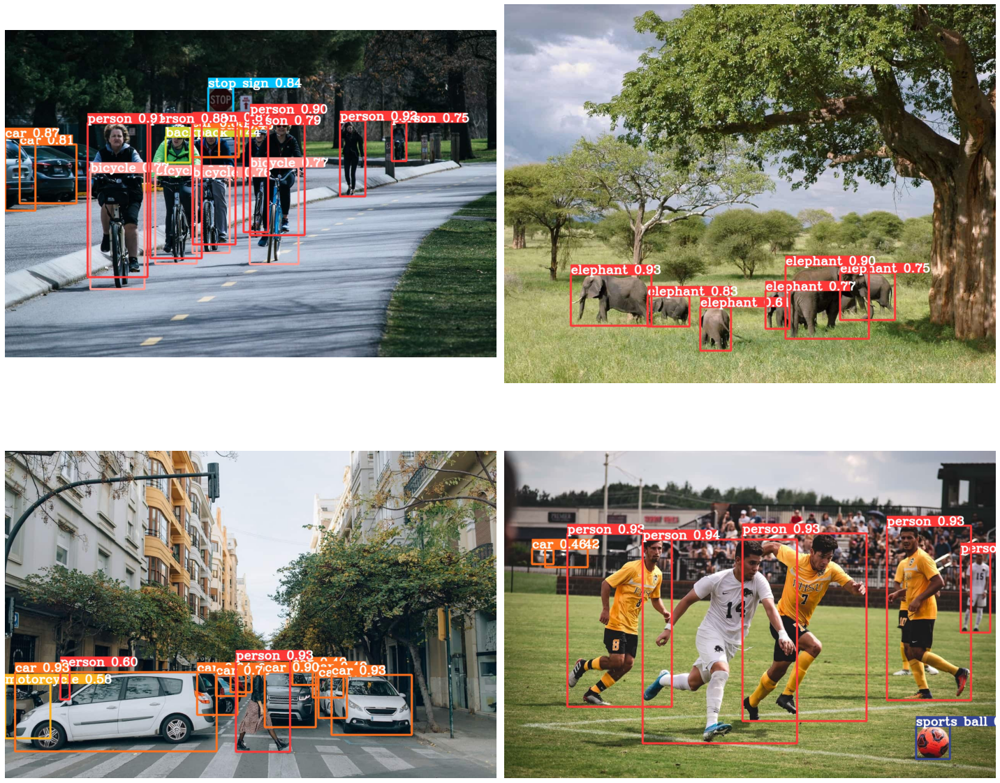

In [12]:
res_dir = 'runs/inference/inference_medium_model/data/'
image_names = os.listdir(res_dir)
show(res_dir, image_names)

## Inference using Nano Model

In [13]:
# Download the YOLO6-N model here.
download_file(
    'https://github.com/meituan/YOLOv6/releases/download/0.2.0/yolov6n.pt',
    'weights/yolov6n.pt'
)

In [14]:
!python tools/infer.py --weights weights/yolov6n.pt --source ../data --name inference_nano_model

Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='inference_nano_model', project='runs/inference', save_dir=None, save_img=True, save_txt=False, source='../data', view_img=False, weights='weights/yolov6n.pt', yaml='data/coco.yaml')
Loading checkpoint from weights/yolov6n.pt

Fusing model...
Switch model to deploy modality.
  0% 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 4/4 [00:00<00:00,  4.18it/s]
Results saved to runs/inference/inference_nano_model


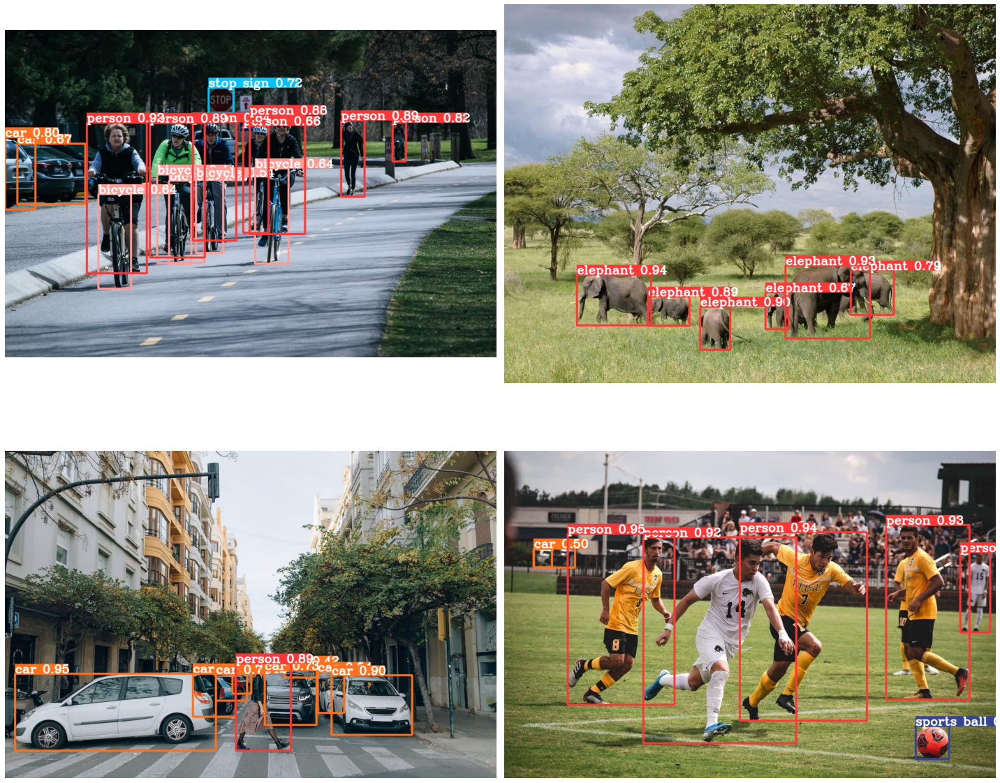

In [15]:
res_dir = 'runs/inference/inference_nano_model/data/'
image_names = os.listdir(res_dir)
show(res_dir, image_names)

## Inference using Large Model

In [16]:
# Download the YOLO6-L model here.
download_file(
    'https://github.com/meituan/YOLOv6/releases/download/0.2.0/yolov6l.pt',
    'weights/yolov6l.pt'
)

In [17]:
!python tools/infer.py --weights weights/yolov6l.pt --source ../data --name inference_large_model

Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='inference_large_model', project='runs/inference', save_dir=None, save_img=True, save_txt=False, source='../data', view_img=False, weights='weights/yolov6l.pt', yaml='data/coco.yaml')
Loading checkpoint from weights/yolov6l.pt

Fusing model...
Switch model to deploy modality.
  0% 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 4/4 [00:07<00:00,  1.98s/it]
Results saved to runs/inference/inference_large_model


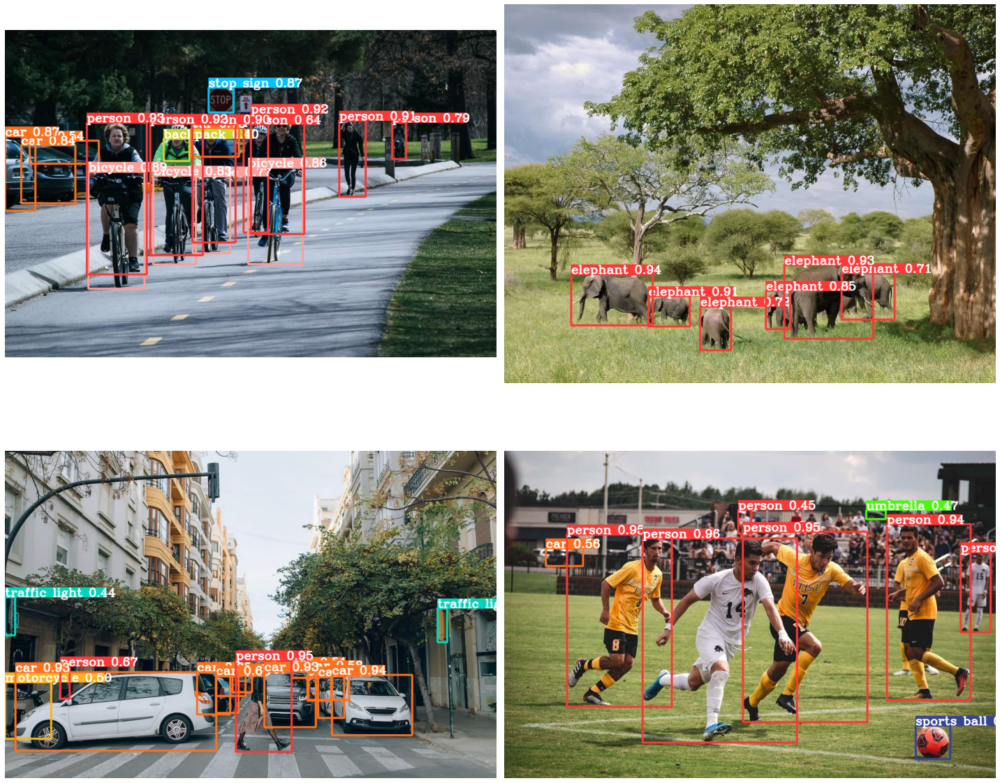

In [18]:
res_dir = 'runs/inference/inference_large_model/data/'
image_names = os.listdir(res_dir)
show(res_dir, image_names)